# Let's Dive into CNNs
## Please read the following paragraph I copy-pasted from ChatGPT:
Welcome back to the exciting world of Convolutional Neural Networks (CNN), building on our previous question which focused on Multilayer Perceptrons (MLP)! As you already know, CNNs are a powerful tool for image and video processing applications. They are designed to recognize patterns and features in visual data, making them a popular choice in computer vision research. One of the reasons why CNNs are preferred over MLPs for image recognition tasks is their ability to handle high-dimensional input data, which preserves spatial information by applying convolutional filters to detect patterns and features at different locations in the input data.

One of the reasons why CNNs are preferred over MLPs for image recognition tasks is their ability to handle high-dimensional input data. MLPs are limited in their ability to process images because they require that the input data be flattened into a one-dimensional vector, which can result in a loss of important spatial information. In contrast, CNNs are designed to handle multi-dimensional data such as images, preserving spatial information by applying convolutional filters to detect patterns and features at different locations in the input data.

In this assignment, we will be playing with the CIFAR-10 dataset to explore different CNN models. We will start by training an auto-encoder for CIFAR images. This auto-encoder will allow us to compare different models, including a Multilayer Perceptron (MLP) model, a CNN-MLP mixed model, and finally a CNN-only model. By comparing the performance of these models, we can gain a deeper understanding of the importance of CNN layers in image processing tasks.

Once we've completed our auto-encoder experiments, we will use the encoder from the best-performing model to train a Siamese network. Siamese networks are a type of neural network that can recognize similarity between two images, making them a popular choice for tasks such as image retrieval and face recognition. By training a Siamese network using the CIFAR-10 dataset, we can gain a better understanding of how CNNs can be used in more complex image recognition tasks.

Overall, this assignment will allow us to explore the many different applications of CNNs in image processing tasks. We'll have the opportunity to experiment with different architectures, compare their performance, and gain valuable insights into how CNNs can be used to solve real-world problems.

🫵Pro-tip: Utilize learnings from previous question to better solve problems in this question.

💭Trivia: Yes, I am allowed use ChatGPT!

## Part 0: Initialization
### Step zero: Import Libraries

In [1]:

import numpy as np
import pandas as pd

import matplotlib
import seaborn as sns
%matplotlib inline
import os
import torch
import torchvision
from torchvision import datasets
from torchvision import transforms
from torch.autograd import Variable
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from tqdm import tqdm
from tabulate import tabulate
import matplotlib.pyplot as plt

from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from google.colab import drive
# drive.mount('/content/drive')
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


In [2]:
# code here
transform = transforms.Compose([
                    transforms.ToTensor(), 
            ])

trainset = datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
testset = datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)


  0%|          | 0/170498071 [00:00<?, ?it/s]

Extracting ./data/cifar-10-python.tar.gz to ./data
Files already downloaded and verified


### Step one: Using a PyTorch Dataset
Load CIFAR-10 dataset from `torchvision.datasets`. Keep batch_size >= 16.

In [3]:
BATCH_SIZE=64
trainloader = torch.utils.data.DataLoader(trainset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
testloader = torch.utils.data.DataLoader(testset, batch_size= BATCH_SIZE, shuffle=False, num_workers=2)

torch.Size([64, 3, 32, 32])
torch.Size([64])


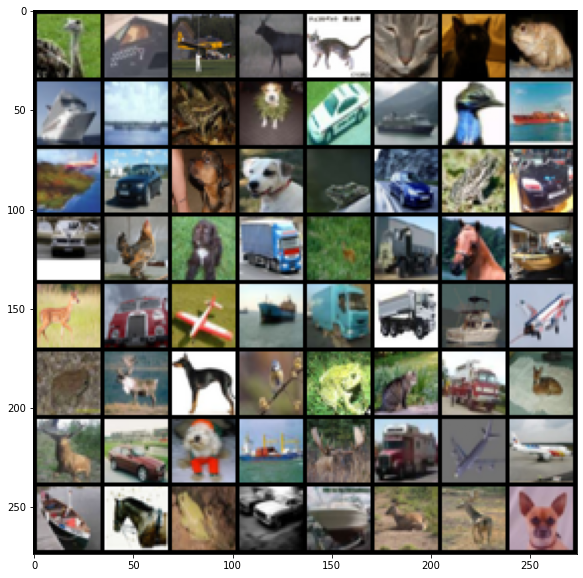

In [4]:
# let's have a look at the dataset
def imshow(img):
    img = img #/ 2 + 0.5     # unnormalize
    npimg = img.numpy()
    plt.figure(figsize=(10,10))
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()


# get some random training images
dataiter = iter(trainloader)
images, labels = next(dataiter)

print(images.shape)
print(labels.shape)

# show images
imshow(torchvision.utils.make_grid(images))

## Part 1: Auto-Encoder
### Step one: Define 3 Models for Auto-Encoder
1. MLP-only model
2. CNN-MLP combination model
3. CNN-only model

In all the models, encoder and decoder should be consisting of $3$ layers each, and the encoder should be giving a flattened representation of size $32$.

Please see that each layer of encoder should decrease or keep equal the output size as compared to input size. Similarly, each layer of decoder should increase or keep equal the output size as compared to input size. 

In [5]:
EPOCHS=10

In [6]:
class MLPAutoEncoder(nn.Module):
  def __init__(self,input_size,batch_size=BATCH_SIZE,z_dim=32):

        super(MLPAutoEncoder,self).__init__()
        
        self.encoder = nn.Sequential(
            nn.Flatten(),
            nn.Linear(input_size, 1028,device=device),nn.ReLU(),
     nn.Linear(1028, 256,device=device),nn.ReLU(),
        nn.Linear(256, z_dim,device=device)
        )

        self.decoder= nn.Sequential(
          nn.Linear(z_dim, 256,device=device),nn.ReLU(),
         nn.Linear(256, 1028,device=device),nn.ReLU(),
        nn.Linear(1028, input_size,device=device),
        nn.Unflatten(1,(3,32,32)),
                nn.Sigmoid(),

        )

  def forward(self,x):

    encode=self.encoder(x)
    decode=self.decoder(encode)
    return encode,decode

class ComboAutoEncoder(nn.Module):
  def __init__(self,batch_size=BATCH_SIZE,z_dim=32):



       super(ComboAutoEncoder,self).__init__()   
       self.encoder =nn.Sequential( nn.Conv2d(3,6,4,stride=2,padding=1),nn.ReLU(),
            nn.Flatten(),
            # nn.Linear(input_size, 1028,device=device),nn.ReLU(),
     nn.Linear(1536, 256,device=device),nn.ReLU(),
        nn.Linear(256, z_dim,device=device)
        )

       self.decoder= nn.Sequential(
          nn.Linear(z_dim, 256,device=device),nn.ReLU(),
         nn.Linear(256, 1536,device=device),nn.ReLU(),
        # nn.Linear(1028, input_size,device=device),
            nn.Unflatten(1, (6, 16, 16)), # 3072 -> 12x16x16
            nn.ConvTranspose2d(6, 3, 4, stride=2, padding=1),
            nn.Sigmoid()
        )
  def forward(self,x):

    encode=self.encoder(x)
    decode=self.decoder(encode)
    return encode,decode

# class CNNAutoEncoder(nn.Module):
#   def __init__(self,batch_size=BATCH_SIZE,z_dim=32):
#        super(CNNAutoEncoder,self).__init__()   
        
#       #  self.encoder=nn.Sequential(nn.Conv2d(3,12,4,stride=2,padding=1),nn.ReLU(),
#       #                             nn.MaxPool2d(3, stride=2),
#       #                             nn.Conv2d(12,8,3,stride=2,padding=1),nn.ReLU(),
#       #                             nn.MaxPool2d(3,stride=1,padding=1),
#       #                           nn.Conv2d(8,2,3,padding=1),nn.ReLU(),
#       #                             # nn.MaxPool2d(3,stride=2),

#       #                             nn.Flatten()
#       #                              )
#        self.conv1=nn.Conv2d(3,32,3,stride=2,padding=1)
#        self.conv2=nn.Conv2d(32,16,3,stride=2,padding=1)
#        self.conv3=nn.Conv2d(16,8,3,stride=2,padding=1)
#        self.max1=nn.MaxPool2d(3, stride=2,return_indices=True)
#       #  self.max2=nn.MaxPool2d(3,stride=1,padding=1,return_indices=True)
#        self.flatten=nn.Flatten()
#        self.pool=nn.MaxPool2d(1,1)
#        self.pool2=nn.MaxPool2d(2,2)
#             #  self.decoder=nn.Sequential(
#       #     nn.Unflatten(1,(2,4,4)),
#       #   nn.ConvTranspose2d(2,8,3,padding=1),nn.ReLU(),
#       #   nn.MaxUnpool2d(3,stride=1,padding=1),
#       #   nn.ConvTranspose2d(8,12,3,stride=2,padding=1),nn.ReLU(),
#       #   nn.MaxUnpool2d(3, stride=2),
#       # nn.ConvTranspose2d(12,3,4,stride=2,padding=1))
#        self.unflatten=nn.Unflatten(1,(8,2,2))
#        self.conv_t1=nn.ConvTranspose2d(8,16,3,stride=2,padding=1)
#        self.conv_t2=nn.ConvTranspose2d(16,32,3,stride=2,padding=1)
#        self.conv_t3=nn.ConvTranspose2d(32,3,3,stride=2,padding=1)
#        self.max_u1=nn.MaxUnpool2d(3,stride=1,padding=1)
#       #  self.max_u2=nn.MaxUnpool2d(3, stride=2)
#        self.sigmoid=nn.Sigmoid()


      
#   def forward(self,x):
#     # encoder
#     encode=F.relu(self.conv1(x))
#     # encode,i2=self.max2(encode)    
#     encode=self.pool2(encode)
#     encode=F.relu(self.conv2(encode))
#     encode=self.pool(encode)
#     encode=F.relu(self.conv3(encode))
#     encode=self.flatten(encode)

#     decode=self.unflatten(encode)
  
#     decode=F.relu(self.conv_t1(decode))
#     decode = F.upsample(decode, scale_factor=1, mode='nearest')

#     decode=F.relu(self.conv_t2(decode))
#     decode = F.upsample(decode, scale_factor=2, mode='nearest')
#     decode=self.sigmoid(self.conv_t3(decode))

#     # decode=self.max_u1(decode,indices=i2)

#     # # # decode=self.max_u2(decode,indices=i1,output_size=(-1,12,16,16))
#     # encode=self.encoder(x)
#     # decode=self.decoder(encode)
#     return encode,decode
  
class ConvAutoencoder(nn.Module):
    def __init__(self):
        super(ConvAutoencoder, self).__init__()
        ## encoder layers ##
        # conv layer (depth from 1 --> 16), 3x3 kernels
        self.conv1 = nn.Conv2d(3, 16, 3, padding=1)  
        # conv layer (depth from 16 --> 8), 3x3 kernels
        self.conv2 = nn.Conv2d(16, 6, 3, padding=1)
        # pooling layer to reduce x-y dims by two; kernel and stride of 2
        self.pool = nn.MaxPool2d(2, 2,return_indices=True)
        self.flatten=nn.Flatten()
        self.unflatten=nn.Unflatten(1,(8,2,2))
        self.conv3=nn.Conv2d(6,8,4,padding=1,stride=2)
        ## decoder layers ##
        self.conv3_1=nn.ConvTranspose2d(8,6,4,padding=1,stride=2)
        self.conv4 = nn.ConvTranspose2d(6, 16, 3, padding=1)
        self.conv5 = nn.ConvTranspose2d(16, 3, 3, padding=1)
        self.unpool=nn.MaxUnpool2d(2,2)
        

    def forward(self, x):
        x = F.relu(self.conv1(x))
        x,i1 = self.pool(x)
        # add hidden layer, with relu activation function
        x = F.relu(self.conv2(x))
        x ,i2= self.pool(x)  # compressed representation
        x=self.conv3(x)
        x,i3=self.pool(x)
        x=self.flatten(x)

        x=self.unflatten(x)
        x=self.unpool(x,i3)
        #x=F.upsample(x, scale_factor=2, mode='nearest')
        x=self.conv3_1(x)
        x=self.unpool(x,i2)
        # x = F.upsample(x, scale_factor=2, mode='nearest')
        x = F.relu(self.conv4(x))
        x=self.unpool(x,i1)
        # # upsample again, output should have a sigmoid applied
        # x = F.upsample(x, scale_factor=2, mode='nearest')
        x = F.sigmoid(self.conv5(x))
        
        return x,x


    # code

In [7]:
from torchsummary import summary
cnn_=ConvAutoencoder().to(device)
summary(cnn_,(3,32,32))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 16, 32, 32]             448
         MaxPool2d-2  [[-1, 16, 16, 16], [-1, 16, 16, 16]]               0
            Conv2d-3            [-1, 6, 16, 16]             870
         MaxPool2d-4  [[-1, 6, 8, 8], [-1, 6, 8, 8]]               0
            Conv2d-5              [-1, 8, 4, 4]             776
         MaxPool2d-6  [[-1, 8, 2, 2], [-1, 8, 2, 2]]               0
           Flatten-7                   [-1, 32]               0
         Unflatten-8              [-1, 8, 2, 2]               0
       MaxUnpool2d-9              [-1, 8, 4, 4]               0
  ConvTranspose2d-10              [-1, 6, 8, 8]             774
      MaxUnpool2d-11            [-1, 6, 16, 16]               0
  ConvTranspose2d-12           [-1, 16, 16, 16]             880
      MaxUnpool2d-13           [-1, 16, 32, 32]               0
  ConvTranspose2d-

/usr/local/lib/python3.9/dist-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


In [8]:
class Autoencoder(nn.Module):
    def __init__(self):
        super(Autoencoder, self).__init__()
        self.encoder = nn.Sequential( # like the Composition layer you built
            nn.Conv2d(3, 16, 3, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(16, 32, 3, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(32, 64, 7),
            nn.Flatten()
        )
        self.decoder = nn.Sequential(nn.Unflatten(1,(64,2,2)),
            nn.ConvTranspose2d(64, 32, 7),
            nn.ReLU(),
            nn.ConvTranspose2d(32, 16, 3, stride=2, padding=1, output_padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(16,3, 3, stride=2, padding=1, output_padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        x = self.encoder(x)
        y = self.decoder(x)
        return x,y


In [9]:
from torchsummary import summary
cnn_=Autoencoder().to(device)
summary(cnn_,(3,32,32))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 16, 16, 16]             448
              ReLU-2           [-1, 16, 16, 16]               0
            Conv2d-3             [-1, 32, 8, 8]           4,640
              ReLU-4             [-1, 32, 8, 8]               0
            Conv2d-5             [-1, 64, 2, 2]         100,416
           Flatten-6                  [-1, 256]               0
         Unflatten-7             [-1, 64, 2, 2]               0
   ConvTranspose2d-8             [-1, 32, 8, 8]         100,384
              ReLU-9             [-1, 32, 8, 8]               0
  ConvTranspose2d-10           [-1, 16, 16, 16]           4,624
             ReLU-11           [-1, 16, 16, 16]               0
  ConvTranspose2d-12            [-1, 3, 32, 32]             435
          Sigmoid-13            [-1, 3, 32, 32]               0
Total params: 210,947
Trainable params:

### Step two: Using MSELoss, train all the models and analyse results
Make sure you also discuss size, time-taken and any other differences you found. Plot MSELoss for each epoch for all models. Also, tabulate the final MSELosses of all models and plot it vis-a-vis:

1. Model Size
2. Model Parameters
3. Time Taken per epoch 

In [10]:
def plot_losses(train_loss,val_loss,name):

  x_data=np.arange(0,len(train_loss))
  plt.plot(x_data,train_loss,label="train")
  plt.plot(x_data,val_loss,label="validation")
  plt.legend()
  plt.title(name)
  plt.show()

  return
  
def reconstruct_imgs(model,dataloader):
  dataiter = iter(trainloader)
  images, labels = next(dataiter)

  _,prediction=model(images.to(device))
  print("Original")
  imshow(torchvision.utils.make_grid(images))
  print("Predictions")
  imshow(torchvision.utils.make_grid(prediction.cpu()))



In [11]:
def train_optim(trainloader,testloader,mlp,optimiser,criterion,name,EPOCHS=EPOCHS,scheduler=None):
    train_loss = []
    val_loss = []
    loss=criterion


    for epoch in range(EPOCHS):
        mlp.train()

        # pbar = tqdm(total=len(trainloader))
        out_loss = 0
        for batch_idx, (data, target) in enumerate(trainloader):
            # do things
            data=data.to(device)
            optimiser.zero_grad()
            target=target.to(device)
            # data_pass,target = data.cuda(),target.cuda()

            encode,decode=mlp(data)
            # print(decode.shape)
            loss_iter=loss(decode,data)
            
            loss_iter.backward()
            optimiser.step()
  
            out_loss += loss_iter.cpu().data.item()
            # pbar.update(1)
            # pbar.desc= f'Loss: {loss.item()}'
        train_loss.append(out_loss/len(trainloader))
        # pbar.set_description("Epoch: {} \nTrain Loss: {}",epoch+1,train_loss[-1])
        # validation step

        mlp.eval()
        with torch.no_grad():
            
            out_loss = 0
            for batch_idx, (data, target) in enumerate(testloader):
                # do things
                # data=data.reshape(-1,28*28).to(device)
                data=data.to(device)
                target = target.to(device)
                encode,decode=mlp(data)
                loss_iter=loss(decode,data)
                out_loss += loss_iter.cpu().data.item()
            val_loss.append(out_loss/len(testloader))
        print("Epoch: {}, Train Loss: {:.4f}, Test Loss: {:.4f}".format(epoch+1,train_loss[-1],val_loss[-1]))
        # pbar.refresh()
        # pbar.close()
  
        if(scheduler==None):
          pass
        else:
          scheduler.step()
    plot_losses(train_loss,val_loss,name)
    #reconstruct test images
    reconstruct_imgs(mlp,trainloader)
    # path="/content/drive/MyDrive/"+name+"_model"
    # try:
    #   os.remove(path)
    # except:
    #   pass
    # torch.save(mlp.state_dict(),path)
    return mlp,train_loss,val_loss

Epoch: 1, Train Loss: 0.0265, Test Loss: 0.0210
Epoch: 2, Train Loss: 0.0194, Test Loss: 0.0178
Epoch: 3, Train Loss: 0.0169, Test Loss: 0.0165
Epoch: 4, Train Loss: 0.0158, Test Loss: 0.0157
Epoch: 5, Train Loss: 0.0150, Test Loss: 0.0147
Epoch: 6, Train Loss: 0.0142, Test Loss: 0.0140
Epoch: 7, Train Loss: 0.0136, Test Loss: 0.0142
Epoch: 8, Train Loss: 0.0133, Test Loss: 0.0134
Epoch: 9, Train Loss: 0.0128, Test Loss: 0.0133
Epoch: 10, Train Loss: 0.0127, Test Loss: 0.0131


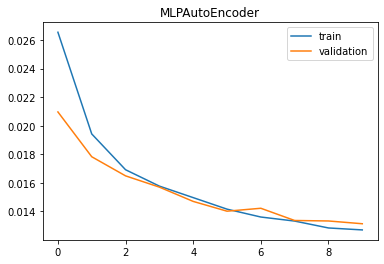

Original


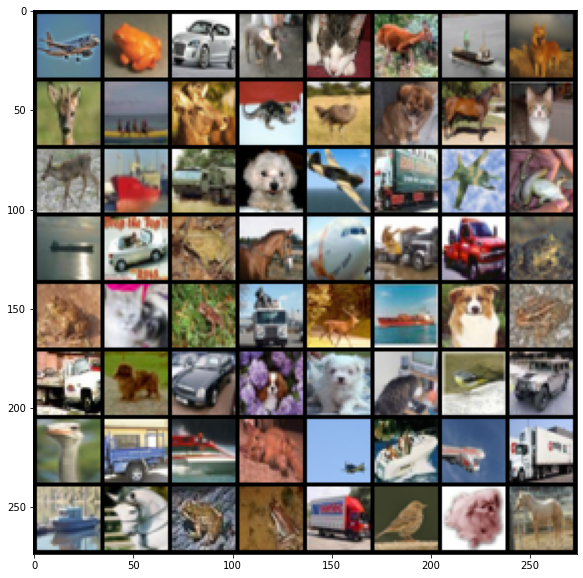

Predictions


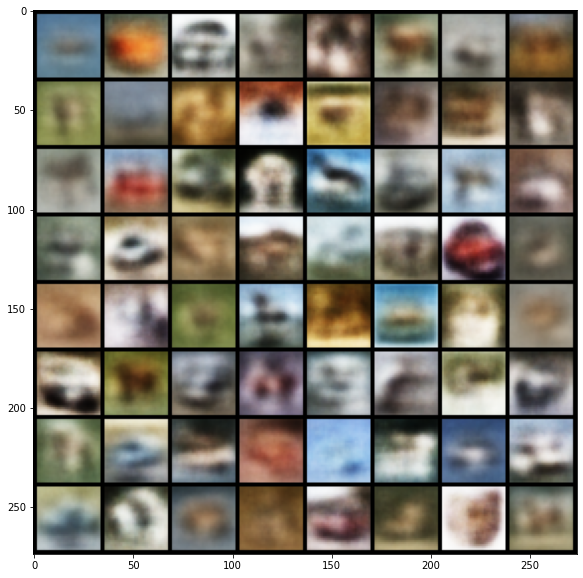

In [ ]:
model_normal=MLPAutoEncoder(3*32*32).to(device)
optimiser=optim.Adam(model_normal.parameters(),lr=1e-3)
criterion=nn.MSELoss().to(device)
model_normal,_,_=train_optim(trainloader,testloader,model_normal,optimiser,criterion,"MLPAutoEncoder",10)


Epoch: 1, Train Loss: 0.0264, Test Loss: 0.0181
Epoch: 2, Train Loss: 0.0159, Test Loss: 0.0148
Epoch: 3, Train Loss: 0.0142, Test Loss: 0.0140
Epoch: 4, Train Loss: 0.0136, Test Loss: 0.0136
Epoch: 5, Train Loss: 0.0134, Test Loss: 0.0134
Epoch: 6, Train Loss: 0.0133, Test Loss: 0.0134
Epoch: 7, Train Loss: 0.0132, Test Loss: 0.0133
Epoch: 8, Train Loss: 0.0131, Test Loss: 0.0132
Epoch: 9, Train Loss: 0.0130, Test Loss: 0.0131
Epoch: 10, Train Loss: 0.0130, Test Loss: 0.0130


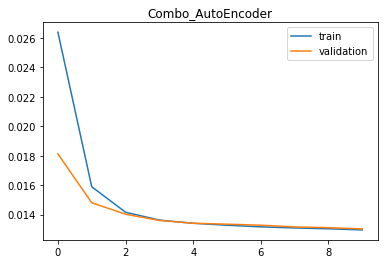

Original


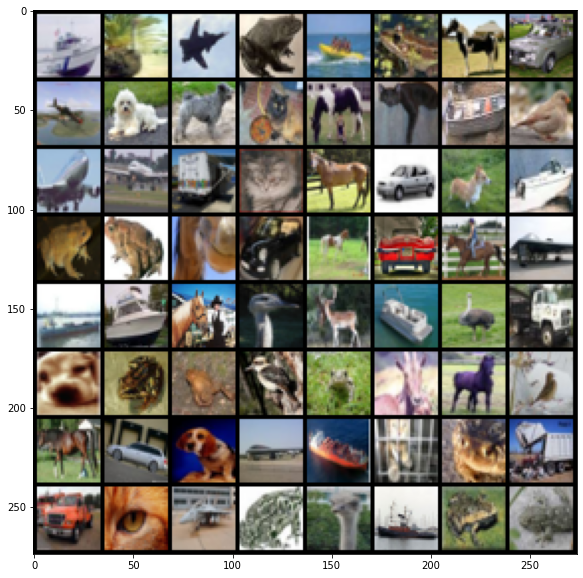

Predictions


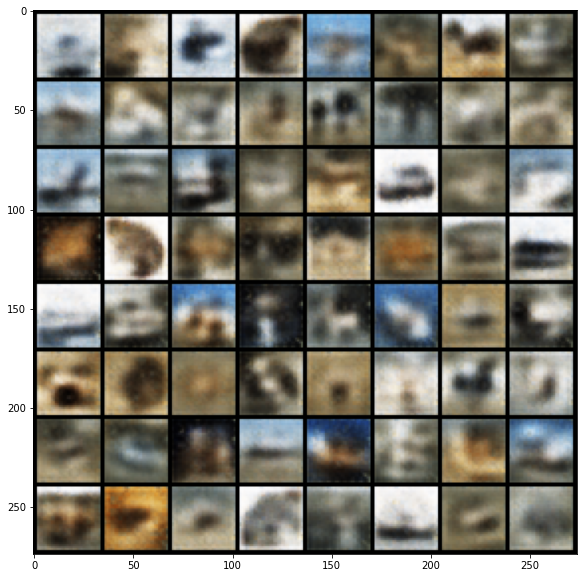

In [ ]:
model_combo=ComboAutoEncoder(3*32*32).to(device)
optimiser=optim.Adam(model_combo.parameters(),lr=1e-3)
criterion=nn.MSELoss().to(device)
model_combo,_,_=train_optim(trainloader,testloader,model_combo,optimiser,criterion,"Combo_AutoEncoder",10)


/usr/local/lib/python3.9/dist-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


Epoch: 1, Train Loss: 0.0236, Test Loss: 0.0156
Epoch: 2, Train Loss: 0.0146, Test Loss: 0.0139
Epoch: 3, Train Loss: 0.0134, Test Loss: 0.0130
Epoch: 4, Train Loss: 0.0124, Test Loss: 0.0118
Epoch: 5, Train Loss: 0.0114, Test Loss: 0.0111
Epoch: 6, Train Loss: 0.0109, Test Loss: 0.0108
Epoch: 7, Train Loss: 0.0106, Test Loss: 0.0107
Epoch: 8, Train Loss: 0.0104, Test Loss: 0.0103
Epoch: 9, Train Loss: 0.0103, Test Loss: 0.0103
Epoch: 10, Train Loss: 0.0102, Test Loss: 0.0103


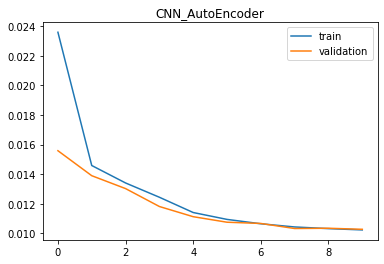

Original


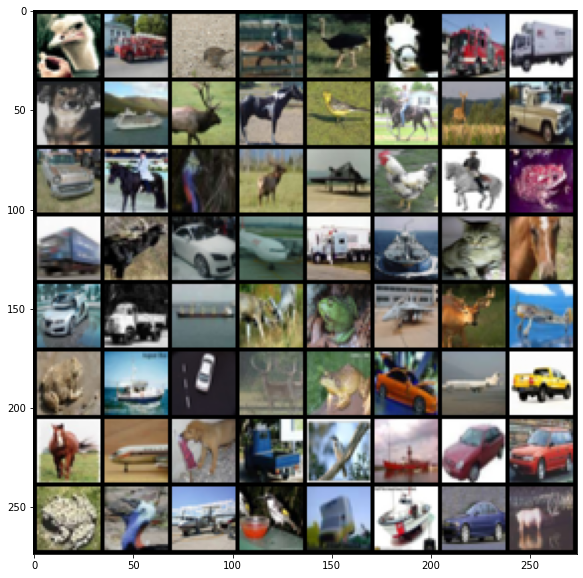

Predictions


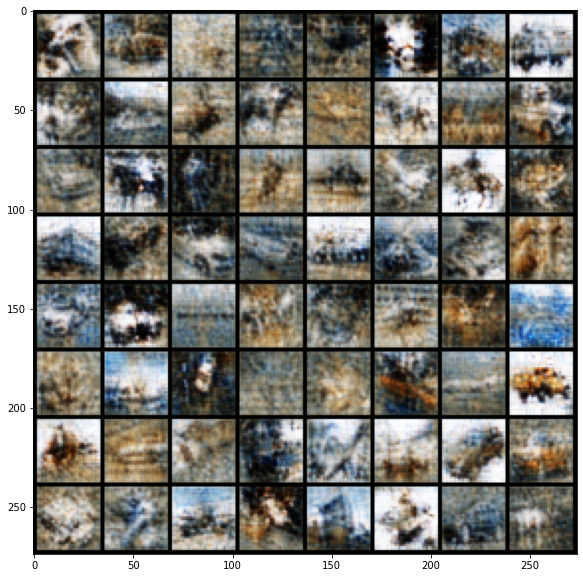

In [ ]:
model_CNN=ConvAutoencoder().to(device)
optimiser=optim.Adam(model_CNN.parameters(),lr=1e-3)
criterion=nn.MSELoss().to(device)

model_CNN,_,_=train_optim(trainloader,testloader,model_CNN,optimiser,criterion,"CNN_AutoEncoder",10)


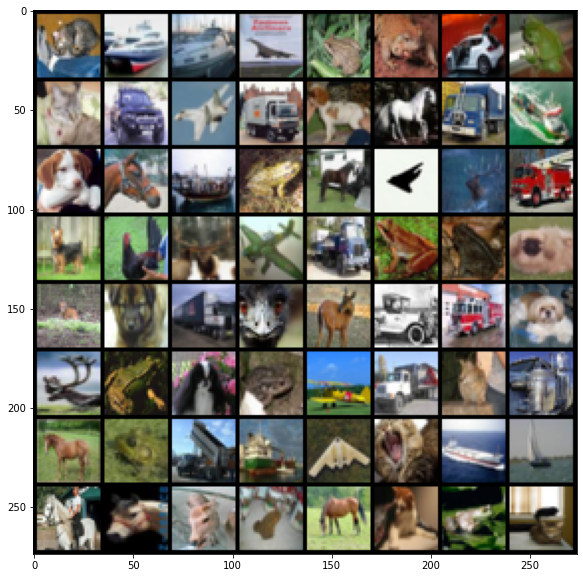

Reconstructed image


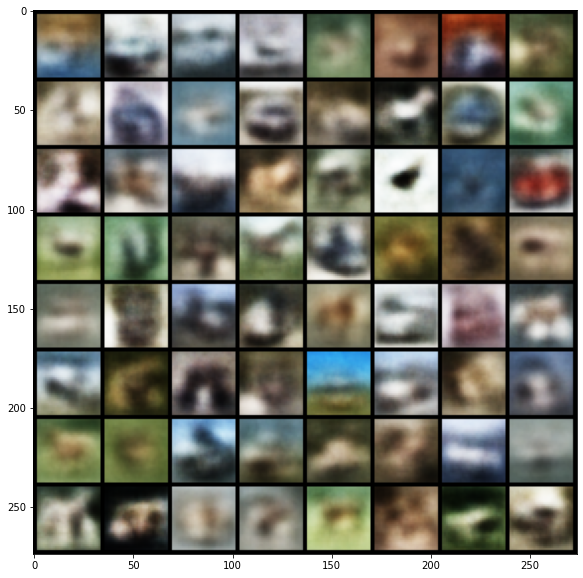

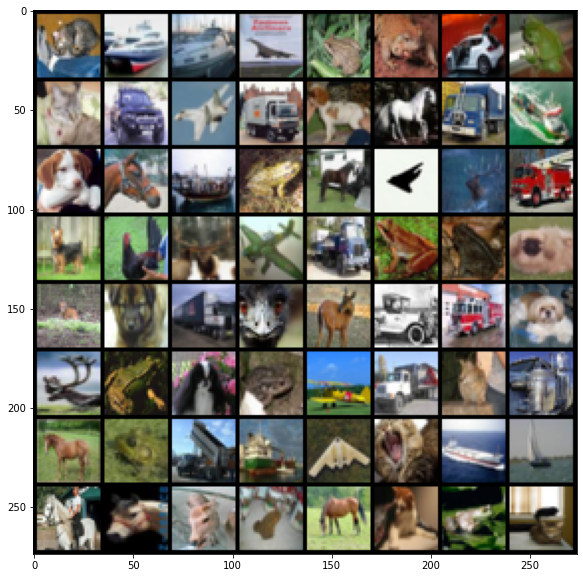

Reconstructed image


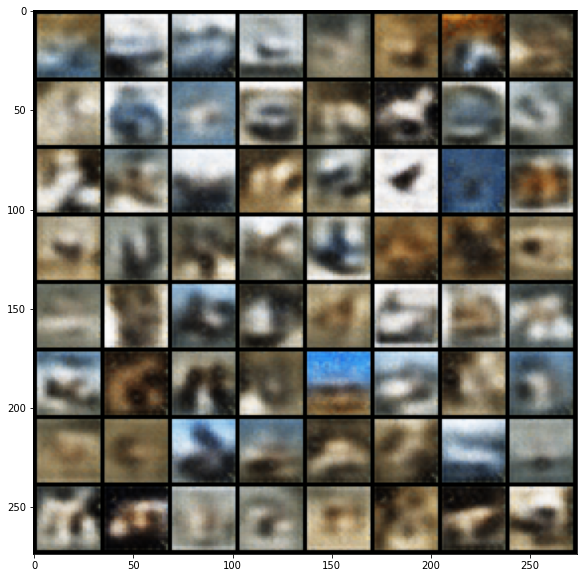

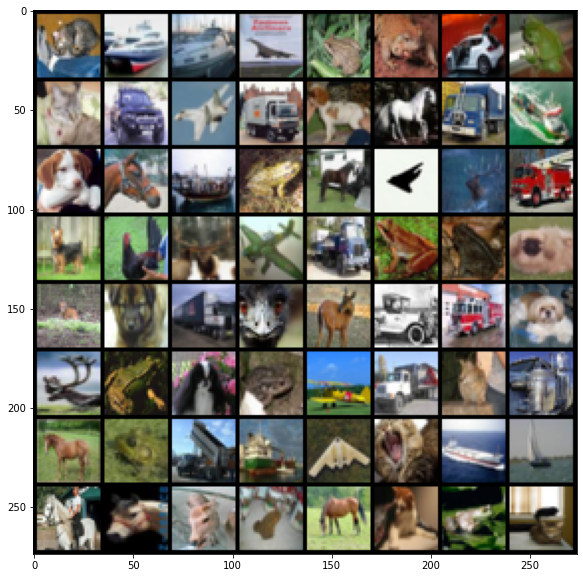

Reconstructed image


/usr/local/lib/python3.9/dist-packages/torch/nn/functional.py:3734: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")
/usr/local/lib/python3.9/dist-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


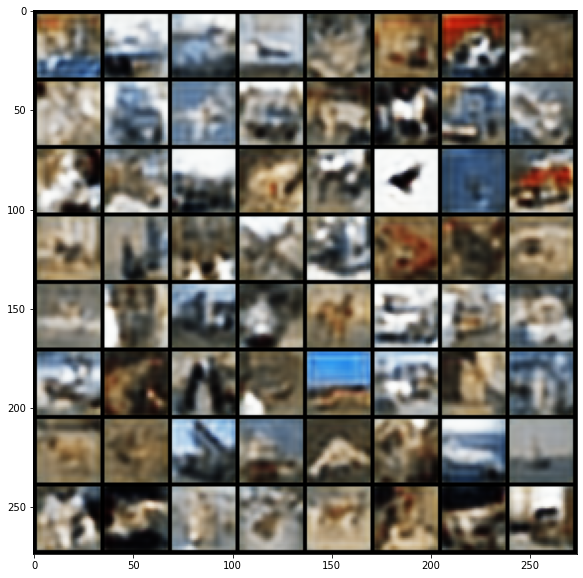

In [ ]:
# Utilize the following code
#--------------MLP--------------#
dataiter = iter(testloader)
images, labels = next(dataiter)
# print('GroundTruth: ', ' '.join('%5s' % classes[labels[j]] for j in range(5)))
imshow(torchvision.utils.make_grid(images))

images = Variable(images)

print("Reconstructed image")
decoded_imgs = model_normal(images.to(device))[1]
imshow(torchvision.utils.make_grid(decoded_imgs.cpu()))

#--------------Combo--------------#
dataiter = iter(testloader)
images, labels = next(dataiter)
# print('GroundTruth: ', ' '.join('%5s' % classes[labels[j]] for j in range(5)))
imshow(torchvision.utils.make_grid(images))

images = Variable(images)

print("Reconstructed image")
decoded_imgs = model_combo(images.to(device))[1]
imshow(torchvision.utils.make_grid(decoded_imgs.cpu()))

#--------------CNN--------------#
dataiter = iter(testloader)
images, labels = next(dataiter)
# print('GroundTruth: ', ' '.join('%5s' % classes[labels[j]] for j in range(5)))
imshow(torchvision.utils.make_grid(images))

images = Variable(images)

print("Reconstructed image")
decoded_imgs = model_CNN(images.to(device))[1]
imshow(torchvision.utils.make_grid(decoded_imgs.cpu()))

In [ ]:
# analysis, plots and tabulations here


When convolution layers are used in favour of linear layers, we see a reduction in the number of parameters. Convolution layers used by CNN, which helps reduce the amount of parameters, are the reason behind this. The Forward/Backward pass size of CNN autoencoders tends to be greater than MLP autoencoders because of the spatial information included in images, however the size of CNN model is significantly higher than MLP or Combination model. The spatial connections between adjacent pixels are taken advantage of by CNN.

We see that, as anticipated, CNN autoencoder has the lowest test loss. For the CNN autoencoder, even the rebuilt images seem better. This is possible because the spatial information of the image can be preserved using CNN autoencoder.


The MLP autoencoder is not able to preserve the spatial information of the image and hence the reconstructed image is not as good as the CNN autoencoder. The Combo autoencoder has only 1 convolution layer and 2 linear layers. Thus, the recontructed image is not as good as the CNN autoencoder.


### Step three: Let's play with Representation Sizes
Spoilers: You must have found CNN to be more effective.

Have you ever wondered how varying the size of a CNN auto-encoder's representation can affect its performance? If so, here's a challenge for you: Implement a CNN auto-encoder with different representation sizes and observe the impact on the reconstruction quality.

Play with the following representation sizes:
1. 10
2. 32
3. 100
4. 1000

When working with different representation sizes in a CNN auto-encoder, we may reach a point of diminishing returns where increasing the representation size does not lead to significant improvements in reconstruction quality. This can be due to factors such as increased model complexity and longer training times. Discuss where you feel we might reach this point of diminishing returns when working with CIFAR-10 dataset and varying representation sizes.

Do analysis as suggested earlier.

In [12]:
class ConvAutoencoder_10(nn.Module):
    def __init__(self):
        super(ConvAutoencoder_10, self).__init__()
        ## encoder layers ##
        # conv layer (depth from 1 --> 16), 3x3 kernels
        self.conv1 = nn.Conv2d(3, 16, 3, padding=1)  
        # conv layer (depth from 16 --> 8), 3x3 kernels
        self.conv2 = nn.Conv2d(16, 6, 3, padding=1)
        # pooling layer to reduce x-y dims by two; kernel and stride of 2
        self.pool = nn.MaxPool2d(2, 2,return_indices=True)
        self.flatten=nn.Flatten()
        self.unflatten=nn.Unflatten(1,(5,2,1))
        self.conv3=nn.Conv2d(6,5,(4,8),padding=1,stride=2)
        ## decoder layers ##
        self.conv3_1=nn.ConvTranspose2d(5,6,(4,8),padding=1,stride=2)
        self.conv4 = nn.ConvTranspose2d(6, 16, 3, padding=1)
        self.conv5 = nn.ConvTranspose2d(16, 3, 3, padding=1)
        self.unpool=nn.MaxUnpool2d(2,2)
        

    def forward(self, x):
        x = F.relu(self.conv1(x))
        x,i1 = self.pool(x)
        x = F.relu(self.conv2(x))
        x ,i2= self.pool(x)  # compressed representation
        x=self.conv3(x)
        x,i3=self.pool(x)
        x=self.flatten(x)

        y=self.unflatten(x)
        y=self.unpool(y,i3)
        y=self.conv3_1(y)
        y=self.unpool(y,i2)
        y = F.relu(self.conv4(y))
        y=self.unpool(y,i1)
        y = F.sigmoid(self.conv5(y))
        
        return x,y

class ConvAutoencoder_100(nn.Module):
    def __init__(self):
        super(ConvAutoencoder_100, self).__init__()
        ## encoder layers ##
        # conv layer (depth from 1 --> 16), 3x3 kernels
        self.conv1 = nn.Conv2d(3, 16, 3, padding=1)  
        # conv layer (depth from 16 --> 8), 3x3 kernels
        self.conv2 = nn.Conv2d(16, 20, 4, padding=1,stride=2)
        # pooling layer to reduce x-y dims by two; kernel and stride of 2
        self.pool = nn.MaxPool2d(2, 2,return_indices=True)
        self.pool2=nn.MaxPool2d(3,1,return_indices=True)
        self.flatten=nn.Flatten()
        self.conv3=nn.Conv2d(20,25,3,padding=1)

        self.unflatten=nn.Unflatten(1,(25,2,2))
        ## decoder layers ##
        self.conv3_1=nn.ConvTranspose2d(25,20,3,padding=1)
        self.conv4 = nn.ConvTranspose2d(20, 16, 4, padding=1,stride=2)
        self.conv5 = nn.ConvTranspose2d(16, 3, 3, padding=1)
        self.unpool=nn.MaxUnpool2d(2,2)
        self.unpool2=nn.MaxUnpool2d(3,1)


    def forward(self, x):
        x = F.relu(self.conv1(x))
        x,i1 = self.pool(x)
        x = F.relu(self.conv2(x))
        x ,i2= self.pool(x)  # compressed representation
        x=self.conv3(x)
        x,i3=self.pool(x)
        x=self.flatten(x)
        y=None
        y=self.unflatten(x)
        y=self.unpool(y,i3)
        y=self.conv3_1(y)
        y=self.unpool(y,i2)
        y = F.relu(self.conv4(y))
        y=self.unpool(y,i1)
        y = F.sigmoid(self.conv5(y))
        
        return x,y


class ConvAutoencoder_1000(nn.Module):
    def __init__(self):
        super(ConvAutoencoder_1000, self).__init__()
        ## encoder layers ##
        # conv layer (depth from 1 --> 16), 3x3 kernels
        self.conv1 = nn.Conv2d(3, 16, 3, padding=1)  
        # conv layer (depth from 16 --> 8), 3x3 kernels
        self.conv2 = nn.Conv2d(16, 48, 3, padding=1)
        # pooling layer to reduce x-y dims by two; kernel and stride of 2
        self.pool = nn.MaxPool2d(2, 2,return_indices=True)
        self.pool2=nn.MaxPool2d((2,6),2,return_indices=True)
        self.flatten=nn.Flatten()
        self.conv3=nn.Conv2d(48,125,3,padding=1)

        self.unflatten=nn.Unflatten(1,(125,4,2))
        ## decoder layers ##
        self.conv3_1=nn.ConvTranspose2d(125,48,3,padding=1)
        self.conv4 = nn.ConvTranspose2d(48, 16, 3, padding=1)
        self.conv5 = nn.ConvTranspose2d(16, 3, 3, padding=1)
        self.unpool=nn.MaxUnpool2d(2,2)
        self.unpool2=nn.MaxUnpool2d((2,6),2)


    def forward(self, x):
        x = F.relu(self.conv1(x))
        x,i1 = self.pool(x)
        x = F.relu(self.conv2(x))
        x ,i2= self.pool(x)  # compressed representation
        x=self.conv3(x)
        x,i3=self.pool2(x)
        x=self.flatten(x)
        y=None
        y=self.unflatten(x)
        y=self.unpool2(y,i3)
        y=self.conv3_1(y)
        y=self.unpool(y,i2)
        y = F.relu(self.conv4(y))
        y=self.unpool(y,i1)
        y = F.sigmoid(self.conv5(y))
        
        return x,y




In [ ]:
from torchsummary import summary
cnn_=ConvAutoencoder_1000().to(device)
summary(cnn_,(3,32,32))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 16, 32, 32]             448
         MaxPool2d-2  [[-1, 16, 16, 16], [-1, 16, 16, 16]]               0
            Conv2d-3           [-1, 48, 16, 16]           6,960
         MaxPool2d-4  [[-1, 48, 8, 8], [-1, 48, 8, 8]]               0
            Conv2d-5            [-1, 125, 8, 8]          54,125
         MaxPool2d-6  [[-1, 125, 4, 2], [-1, 125, 4, 2]]               0
           Flatten-7                 [-1, 1000]               0
         Unflatten-8            [-1, 125, 4, 2]               0
       MaxUnpool2d-9            [-1, 125, 8, 8]               0
  ConvTranspose2d-10             [-1, 48, 8, 8]          54,048
      MaxUnpool2d-11           [-1, 48, 16, 16]               0
  ConvTranspose2d-12           [-1, 16, 16, 16]           6,928
      MaxUnpool2d-13           [-1, 16, 32, 32]               0
  ConvTransp

/usr/local/lib/python3.9/dist-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


Epoch: 1, Train Loss: 0.0261, Test Loss: 0.0180
Epoch: 2, Train Loss: 0.0168, Test Loss: 0.0161
Epoch: 3, Train Loss: 0.0158, Test Loss: 0.0154
Epoch: 4, Train Loss: 0.0150, Test Loss: 0.0147
Epoch: 5, Train Loss: 0.0145, Test Loss: 0.0144
Epoch: 6, Train Loss: 0.0142, Test Loss: 0.0141
Epoch: 7, Train Loss: 0.0138, Test Loss: 0.0134
Epoch: 8, Train Loss: 0.0134, Test Loss: 0.0134
Epoch: 9, Train Loss: 0.0133, Test Loss: 0.0134
Epoch: 10, Train Loss: 0.0133, Test Loss: 0.0133


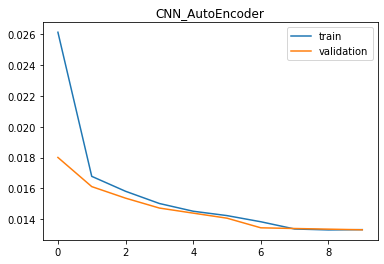

Original


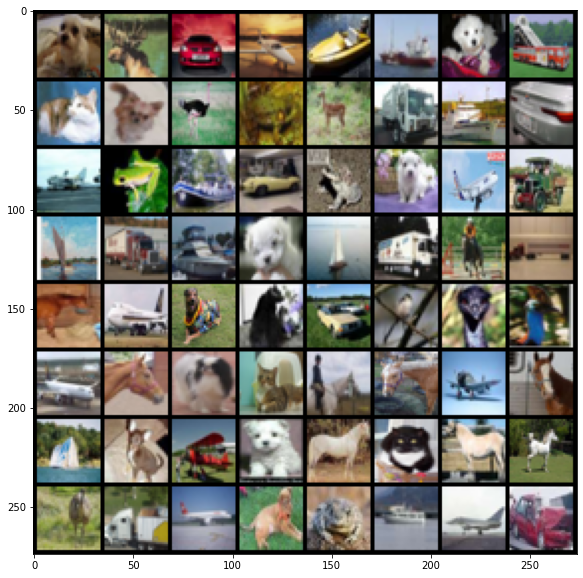

Predictions


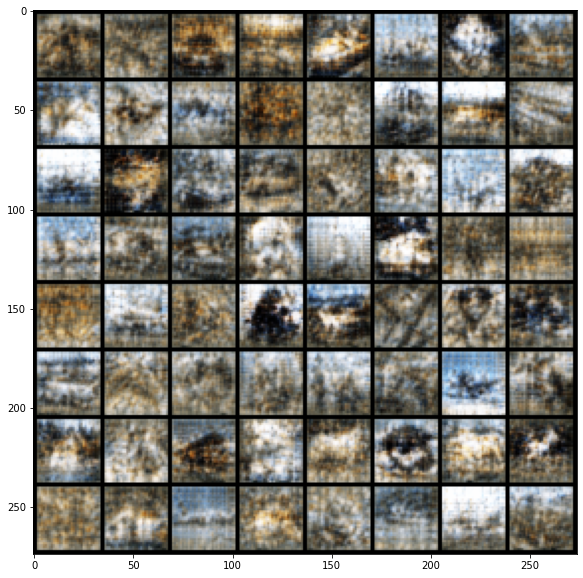

In [ ]:
model_CNN_10=ConvAutoencoder_10().to(device)
optimiser=optim.Adam(model_CNN_10.parameters(),lr=1e-3)
criterion=nn.MSELoss().to(device)

model_CNN_10,_,_=train_optim(trainloader,testloader,model_CNN_10,optimiser,criterion,"CNN_AutoEncoder_10",10)


Epoch: 1, Train Loss: 0.0219, Test Loss: 0.0132
Epoch: 2, Train Loss: 0.0118, Test Loss: 0.0107
Epoch: 3, Train Loss: 0.0101, Test Loss: 0.0096
Epoch: 4, Train Loss: 0.0092, Test Loss: 0.0087
Epoch: 5, Train Loss: 0.0085, Test Loss: 0.0082
Epoch: 6, Train Loss: 0.0080, Test Loss: 0.0079
Epoch: 7, Train Loss: 0.0078, Test Loss: 0.0077
Epoch: 8, Train Loss: 0.0075, Test Loss: 0.0072
Epoch: 9, Train Loss: 0.0071, Test Loss: 0.0069
Epoch: 10, Train Loss: 0.0069, Test Loss: 0.0069


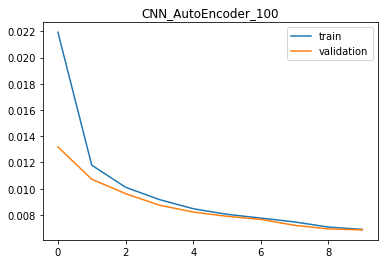

Original


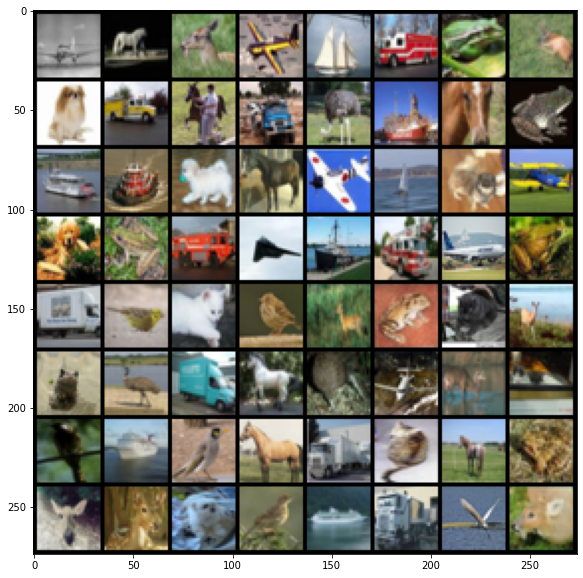

Predictions


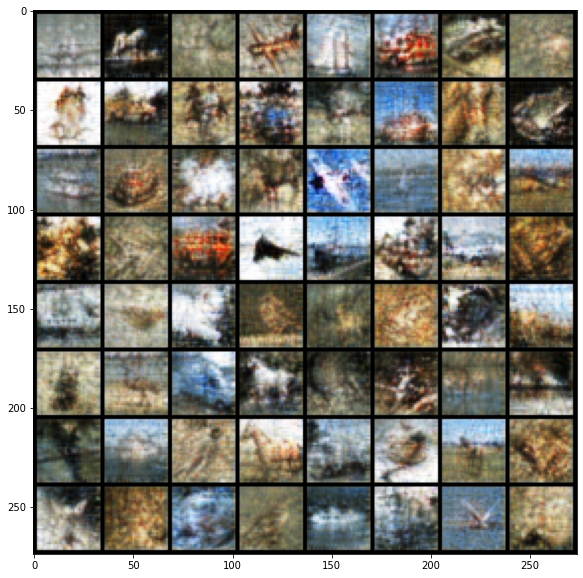

In [ ]:
model_CNN_100=ConvAutoencoder_100().to(device)
optimiser=optim.Adam(model_CNN_100.parameters(),lr=1e-3)
criterion=nn.MSELoss().to(device)

model_CNN_100,_,_=train_optim(trainloader,testloader,model_CNN_100,optimiser,criterion,"CNN_AutoEncoder_100",10)


/usr/local/lib/python3.9/dist-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


Epoch: 1, Train Loss: 0.0117, Test Loss: 0.0056
Epoch: 2, Train Loss: 0.0050, Test Loss: 0.0046
Epoch: 3, Train Loss: 0.0043, Test Loss: 0.0040
Epoch: 4, Train Loss: 0.0037, Test Loss: 0.0038
Epoch: 5, Train Loss: 0.0035, Test Loss: 0.0034
Epoch: 6, Train Loss: 0.0033, Test Loss: 0.0032
Epoch: 7, Train Loss: 0.0031, Test Loss: 0.0031
Epoch: 8, Train Loss: 0.0030, Test Loss: 0.0030
Epoch: 9, Train Loss: 0.0029, Test Loss: 0.0029
Epoch: 10, Train Loss: 0.0028, Test Loss: 0.0030


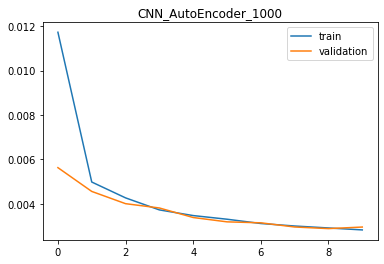

Original


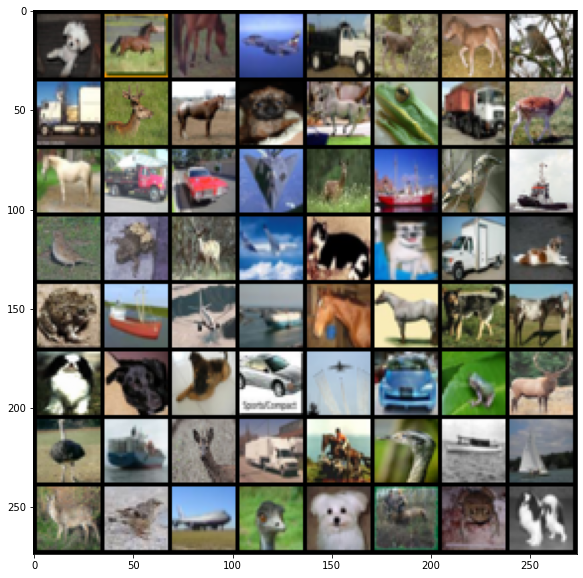

Predictions


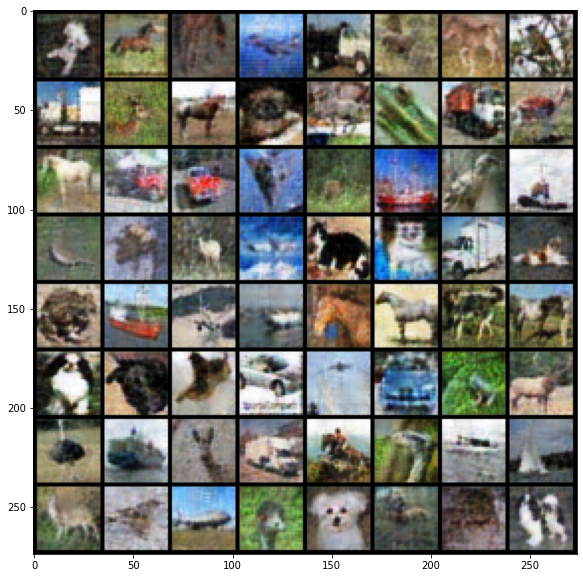

In [ ]:
model_CNN_1000=ConvAutoencoder_1000().to(device)
optimiser=optim.Adam(model_CNN_1000.parameters(),lr=1e-3)
criterion=nn.MSELoss().to(device)

model_CNN_1000,_,_=train_optim(trainloader,testloader,model_CNN_1000,optimiser,criterion,"CNN_AutoEncoder_1000",10)



We notice that increasing the representation size (while maintaining the same number of layers = 3) improves the appearance of the reconstructed images. This is so that an autoencoder can learn more intricate and detailed representations of the input data when its representation size is increased. As a result, the decoder can produce more precise reconstructions and the encoder can capture more characteristics and patterns in the input.

However, going overboard with the representation size increase could result in overfitting.

When we raise the representation size from 10 to 100, we observe that the reconstructed images much improve. When we raise the representation size from 100 to 1000, the reconstructed images do not significantly better.

### Step four: What about the number of layers?

Experimenting with different numbers of layers in the encoder and decoder of a CNN auto-encoder can have a significant impact on its performance with CIFAR-10 dataset. For our next challenge, let's explore how the number of layers can affect the quality of the reconstructed images. Would a deeper or shallower network be more effective for this task?

Play with the following numbers of layers for encoder and decoder each:
1. 1
2. 3
3. 5
4. 10

When experimenting with different numbers of layers in the encoder and decoder of a CNN auto-encoder, we may reach a point of diminishing returns where adding more layers does not result in significant improvements in reconstruction quality. Additionally, deeper networks may be prone to overfitting, especially when training data is limited. Discuss where you feel we reach it. 

Do analysis as suggested earlier.

In [ ]:
class ConvAutoencoder_1(nn.Module):
    def __init__(self):
        super(ConvAutoencoder_1, self).__init__()
        ## encoder layers ##
        # conv layer (depth from 1 --> 16), 3x3 kernels
        self.conv1 = nn.Conv2d(3, 16, 3, padding=1)  
        # conv layer (depth from 16 --> 8), 3x3 kernels
        self.conv2 = nn.Conv2d(16, 48, 3, padding=1)
        # pooling layer to reduce x-y dims by two; kernel and stride of 2
        self.pool = nn.MaxPool2d(2, 2,return_indices=True)
        self.pool2=nn.MaxPool2d((2,6),2,return_indices=True)
        self.flatten=nn.Flatten()
        self.conv3=nn.Conv2d(48,125,3,padding=1)

        self.unflatten=nn.Unflatten(1,(16,16,16))
        ## decoder layers ##
        self.conv3_1=nn.ConvTranspose2d(125,48,3,padding=1)
        self.conv4 = nn.ConvTranspose2d(48, 16, 3, padding=1)
        self.conv5 = nn.ConvTranspose2d(16, 3, 3, padding=1)
        self.unpool=nn.MaxUnpool2d(2,2)
        self.unpool2=nn.MaxUnpool2d((2,6),2)


    def forward(self, x):
        x = F.relu(self.conv1(x))
        x,i1 = self.pool(x)
        # x = F.relu(self.conv2(x))
        # x ,i2= self.pool(x)  # compressed representation
        # x=self.conv3(x)
        # x,i3=self.pool2(x)
        x=self.flatten(x)
        y=None
        y=self.unflatten(x)
        # y=self.unpool2(y,i3)
        # y=self.conv3_1(y)
        # y=self.unpool(y,i2)
        # y = F.relu(self.conv4(y))
        y=self.unpool(y,i1)
        y = F.sigmoid(self.conv5(y))
        
        return x,y

class ConvAutoencoder_3(nn.Module):
    def __init__(self):
        super(ConvAutoencoder_3, self).__init__()
        ## encoder layers ##
        # conv layer (depth from 1 --> 16), 3x3 kernels
        self.conv1 = nn.Conv2d(3, 16, 3, padding=1)  
        # conv layer (depth from 16 --> 8), 3x3 kernels
        self.conv2 = nn.Conv2d(16, 48, 3, padding=1)
        # pooling layer to reduce x-y dims by two; kernel and stride of 2
        self.pool = nn.MaxPool2d(2, 2,return_indices=True)
        self.pool2=nn.MaxPool2d((2,6),2,return_indices=True)
        self.flatten=nn.Flatten()
        self.conv3=nn.Conv2d(48,125,3,padding=1)

        self.unflatten=nn.Unflatten(1,(125,4,2))
        ## decoder layers ##
        self.conv3_1=nn.ConvTranspose2d(125,48,3,padding=1)
        self.conv4 = nn.ConvTranspose2d(48, 16, 3, padding=1)
        self.conv5 = nn.ConvTranspose2d(16, 3, 3, padding=1)
        self.unpool=nn.MaxUnpool2d(2,2)
        self.unpool2=nn.MaxUnpool2d((2,6),2)


    def forward(self, x):
        x = F.relu(self.conv1(x))
        x,i1 = self.pool(x)
        x = F.relu(self.conv2(x))
        x ,i2= self.pool(x)  # compressed representation
        x=self.conv3(x)
        x,i3=self.pool2(x)
        x=self.flatten(x)
        y=None
        y=self.unflatten(x)
        y=self.unpool2(y,i3)
        y=self.conv3_1(y)
        y=self.unpool(y,i2)
        y = F.relu(self.conv4(y))
        y=self.unpool(y,i1)
        y = F.sigmoid(self.conv5(y))
        
        return x,y




class ConvAutoencoder_5(nn.Module):
    def __init__(self):
        super(ConvAutoencoder_5, self).__init__()
        self.conv1 = nn.Conv2d(3, 16, 3, padding=1)  
        # conv layer (depth from 16 --> 8), 3x3 kernels
        self.conv2 = nn.Conv2d(16, 32, 3, padding=1)
        # pooling layer to reduce x-y dims by two; kernel and stride of 2
        self.pool = nn.MaxPool2d(2, 2,return_indices=True)
        # self.pool2=nn.MaxPool2d((2,6),2,return_indices=True)
        self.flatten=nn.Flatten()
        self.conv3=nn.Conv2d(32,64,3,padding=1)
        self.conv4=nn.Conv2d(64,128,3,padding=1)
        self.conv5=nn.Conv2d(128,256,3,padding=1)
        self.sigmoid=nn.Sigmoid()
        self.unflatten=nn.Unflatten(1,(256,4,4))
        ## decoder layers ##
        self.convtrans1=nn.ConvTranspose2d(256,128,3,padding=1)
        self.convtrans2 = nn.ConvTranspose2d(128, 64, 3, padding=1)
        self.convtrans3 = nn.ConvTranspose2d(64, 32, 3, padding=1)
        self.convtrans4 = nn.ConvTranspose2d(32, 16, 3, padding=1)
        self.convtrans5 = nn.ConvTranspose2d(16, 3, 3, padding=1)

        self.unpool=nn.MaxUnpool2d(2,2)
        # self.unpool2=nn.MaxUnpool2d((2,6),2)


    def forward(self, x):
        x = F.relu(self.conv1(x))
        # x,i1 = self.pool(x)
        x = F.relu(self.conv2(x))
        # x ,i2= self.pool(x)  # compressed representation
        x=F.relu(self.conv3(x))
        x,i1 = self.pool(x)
        x=F.relu(self.conv4(x))
        x,i2= self.pool(x)
        x=self.conv5(x)
        x,i3=self.pool(x)
        x=self.flatten(x)
        y=None
        y=self.unflatten(x)
        y=self.unpool(y,i3)
        y=self.convtrans1(y)
        y=self.unpool(y,i2)
        y = F.relu(self.convtrans2(y))
        y=self.unpool(y,i1)
        y = F.relu(self.convtrans3(y))
        y=F.relu(self.convtrans4(y))
        y=self.sigmoid(self.convtrans5(y))
        
        return x,y

class ConvAutoencoder_10_layer(nn.Module):
    def __init__(self):
        super(ConvAutoencoder_10_layer, self).__init__()
        self.conv1 = nn.Conv2d(3, 16, 3, padding=1)  
        # conv layer (depth from 16 --> 8), 3x3 kernels
        self.conv2 = nn.Conv2d(16, 32, 3, padding=1)
        
        # pooling layer to reduce x-y dims by two; kernel and stride of 2
        self.pool = nn.MaxPool2d(2, 2,return_indices=True)
        # self.pool2=nn.MaxPool2d((2,6),2,return_indices=True)
        self.flatten=nn.Flatten()
        self.conv3=nn.Conv2d(32,64,3,padding=1)
        self.conv4=nn.Conv2d(64,128,3,padding=1)
        self.conv5=nn.Conv2d(128,256,3,padding=1)
        self.conv6=nn.Conv2d(256,512,3,padding=1)
        self.conv7=nn.Conv2d(64,64,3,padding=1)
        self.conv8=nn.Conv2d(128,128,3,padding=1)
        self.conv9=nn.Conv2d(256,256,3,padding=1)
        self.conv10=nn.Conv2d(512,512,3,padding=1)
        self.sigmoid=nn.Sigmoid()
        self.unflatten=nn.Unflatten(1,(512,2,2))
        ## decoder layers ##

        self.convtrans1=nn.ConvTranspose2d(512,256,3,padding=1)
        self.convtrans2 = nn.ConvTranspose2d(256, 128, 3, padding=1)
        self.convtrans3 = nn.ConvTranspose2d(128, 64, 3, padding=1)
        self.convtrans4 = nn.ConvTranspose2d(64, 32, 3, padding=1)
        self.convtrans5 = nn.ConvTranspose2d(32, 16, 3, padding=1)
        self.convtrans6=nn.ConvTranspose2d(16,3,3,padding=1)
        self.convtrans7=nn.ConvTranspose2d(64,64,3,padding=1)
        self.convtrans8=nn.ConvTranspose2d(128,128,3,padding=1)
        self.convtrans9=nn.ConvTranspose2d(256,256,3,padding=1)
        self.convtrans10=nn.ConvTranspose2d(512,512,3,padding=1)

        self.unpool=nn.MaxUnpool2d(2,2)
        # self.unpool2=nn.MaxUnpool2d((2,6),2)


    def forward(self, x):
        x = F.relu(self.conv1(x))
        # x,i1 = self.pool(x)
        x = F.relu(self.conv2(x))
        # x ,i2= self.pool(x)  # compressed representation
        x=F.relu(self.conv3(x))
        x=F.relu(self.conv7(x))
        x,i1 = self.pool(x)
        x=F.relu(self.conv4(x))
        x=F.relu(self.conv8(x))
        x,i2= self.pool(x)
        x=F.relu(self.conv5(x))
        x=F.relu(self.conv9(x))
        x,i3=self.pool(x)
        x=F.relu(self.conv6(x))
        x=self.conv10(x)
        x,i4=self.pool(x)



        x=self.flatten(x)
        y=None
        y=self.unflatten(x)


        y=self.unpool(y,i4)
        y=self.convtrans10(y)
        y=F.relu(self.convtrans1(y))
        y=self.unpool(y,i3)
        y=F.relu(self.convtrans9(y))
        y = F.relu(self.convtrans2(y))
        y=self.unpool(y,i2)
        y=F.relu(self.convtrans8(y))
        y = F.relu(self.convtrans3(y))
        y=self.unpool(y,i1)
        y=F.relu(self.convtrans7(y))
        y=F.relu(self.convtrans4(y))
        y=F.relu(self.convtrans5(y))
        y=self.sigmoid(self.convtrans6(y))

        return x,y




In [ ]:
from torchsummary import summary
cnn_=ConvAutoencoder_10_layer().to(device)
summary(cnn_,(3,32,32))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 16, 32, 32]             448
            Conv2d-2           [-1, 32, 32, 32]           4,640
            Conv2d-3           [-1, 64, 32, 32]          18,496
            Conv2d-4           [-1, 64, 32, 32]          36,928
         MaxPool2d-5  [[-1, 64, 16, 16], [-1, 64, 16, 16]]               0
            Conv2d-6          [-1, 128, 16, 16]          73,856
            Conv2d-7          [-1, 128, 16, 16]         147,584
         MaxPool2d-8  [[-1, 128, 8, 8], [-1, 128, 8, 8]]               0
            Conv2d-9            [-1, 256, 8, 8]         295,168
           Conv2d-10            [-1, 256, 8, 8]         590,080
        MaxPool2d-11  [[-1, 256, 4, 4], [-1, 256, 4, 4]]               0
           Conv2d-12            [-1, 512, 4, 4]       1,180,160
           Conv2d-13            [-1, 512, 4, 4]       2,359,808
        Ma

Epoch: 1, Train Loss: 0.0164, Test Loss: 0.0060
Epoch: 2, Train Loss: 0.0048, Test Loss: 0.0038
Epoch: 3, Train Loss: 0.0034, Test Loss: 0.0031
Epoch: 4, Train Loss: 0.0030, Test Loss: 0.0029
Epoch: 5, Train Loss: 0.0029, Test Loss: 0.0028
Epoch: 6, Train Loss: 0.0028, Test Loss: 0.0027
Epoch: 7, Train Loss: 0.0027, Test Loss: 0.0027
Epoch: 8, Train Loss: 0.0027, Test Loss: 0.0026
Epoch: 9, Train Loss: 0.0026, Test Loss: 0.0026
Epoch: 10, Train Loss: 0.0025, Test Loss: 0.0025


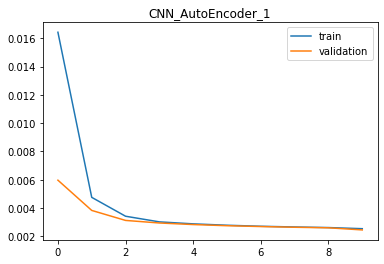

Original


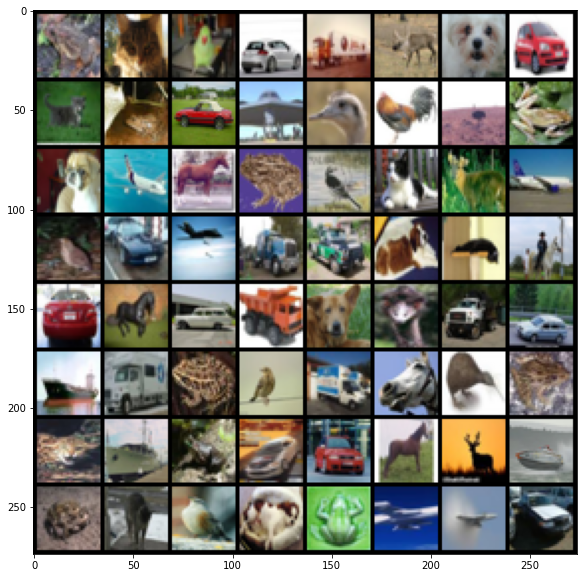

Predictions


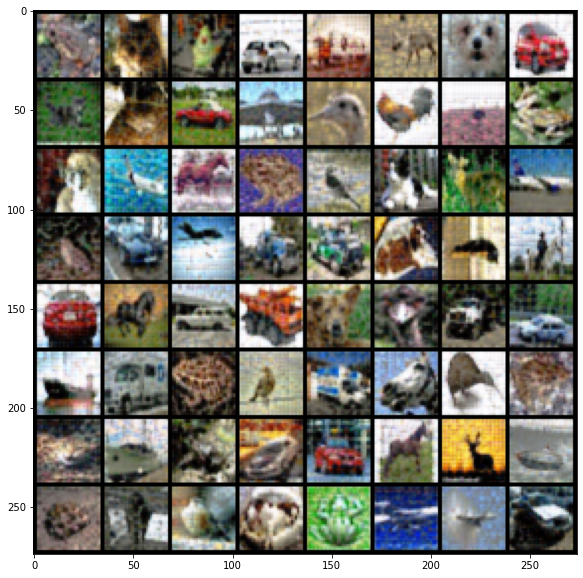

In [ ]:
model_CNN_1=ConvAutoencoder_1().to(device)
optimiser=optim.Adam(model_CNN_1.parameters(),lr=1e-3)
criterion=nn.MSELoss().to(device)

model_CNN_1,_,_=train_optim(trainloader,testloader,model_CNN_1,optimiser,criterion,"CNN_AutoEncoder_1",10)


/usr/local/lib/python3.9/dist-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


Epoch: 1, Train Loss: 0.0118, Test Loss: 0.0062
Epoch: 2, Train Loss: 0.0053, Test Loss: 0.0048
Epoch: 3, Train Loss: 0.0045, Test Loss: 0.0042
Epoch: 4, Train Loss: 0.0039, Test Loss: 0.0037
Epoch: 5, Train Loss: 0.0036, Test Loss: 0.0035
Epoch: 6, Train Loss: 0.0034, Test Loss: 0.0034
Epoch: 7, Train Loss: 0.0034, Test Loss: 0.0033
Epoch: 8, Train Loss: 0.0033, Test Loss: 0.0034
Epoch: 9, Train Loss: 0.0035, Test Loss: 0.0036
Epoch: 10, Train Loss: 0.0035, Test Loss: 0.0034


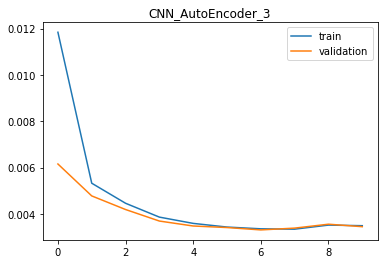

Original


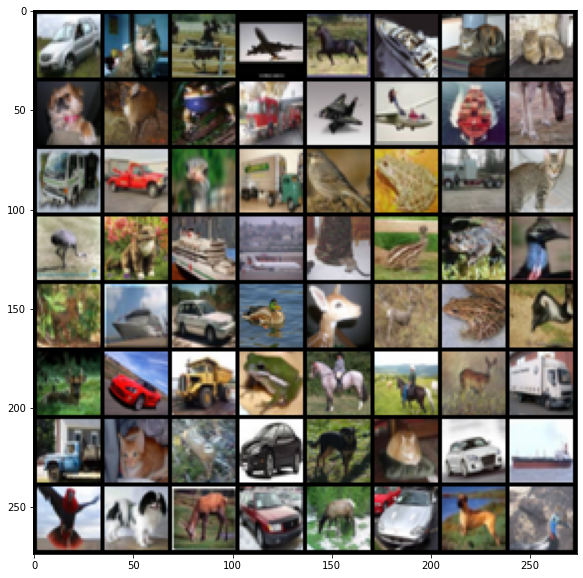

Predictions


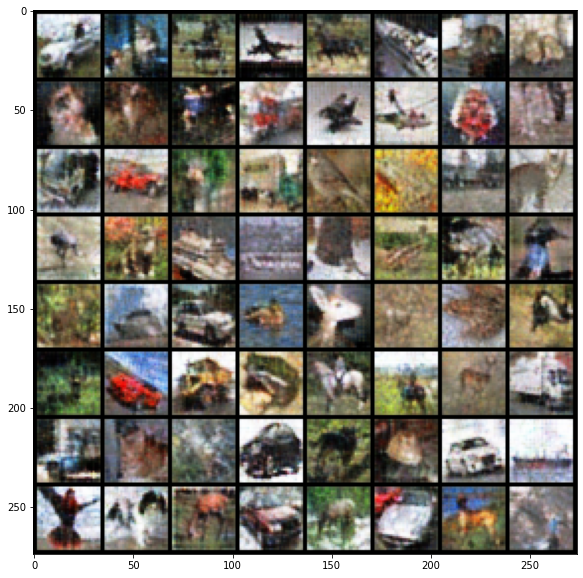

In [ ]:
model_CNN_3=ConvAutoencoder_3().to(device)
optimiser=optim.Adam(model_CNN_3.parameters(),lr=1e-3)
criterion=nn.MSELoss().to(device)

model_CNN_3,_,_=train_optim(trainloader,testloader,model_CNN_3,optimiser,criterion,"CNN_AutoEncoder_3",10)


Epoch: 1, Train Loss: 0.0084, Test Loss: 0.0029
Epoch: 2, Train Loss: 0.0022, Test Loss: 0.0017
Epoch: 3, Train Loss: 0.0016, Test Loss: 0.0015
Epoch: 4, Train Loss: 0.0014, Test Loss: 0.0013
Epoch: 5, Train Loss: 0.0013, Test Loss: 0.0013
Epoch: 6, Train Loss: 0.0012, Test Loss: 0.0013
Epoch: 7, Train Loss: 0.0011, Test Loss: 0.0010
Epoch: 8, Train Loss: 0.0010, Test Loss: 0.0013
Epoch: 9, Train Loss: 0.0010, Test Loss: 0.0010
Epoch: 10, Train Loss: 0.0009, Test Loss: 0.0009


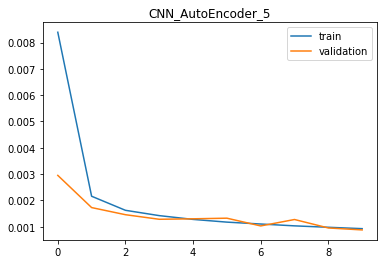

Original


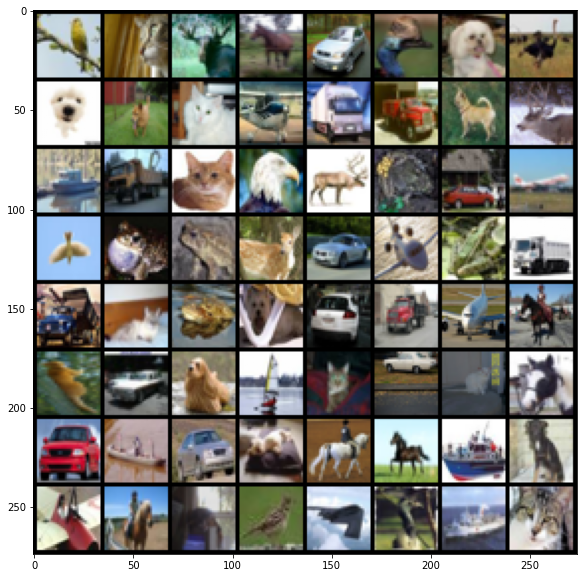

Predictions


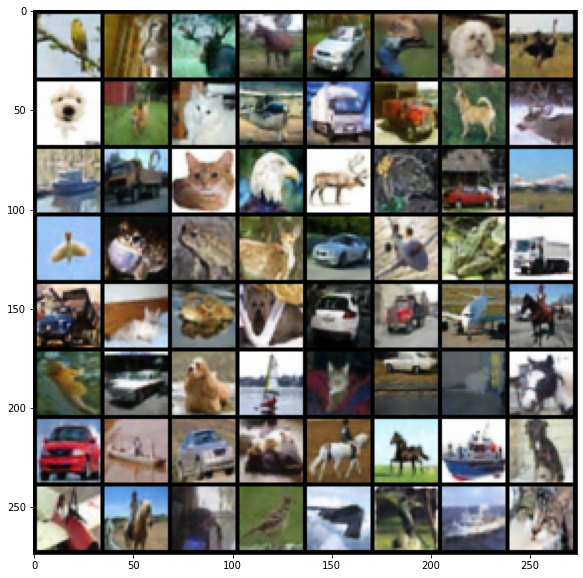

In [ ]:
model_CNN_5=ConvAutoencoder_5().to(device)
optimiser=optim.Adam(model_CNN_5.parameters(),lr=1e-3)
criterion=nn.MSELoss().to(device)

model_CNN_5,_,_=train_optim(trainloader,testloader,model_CNN_5,optimiser,criterion,"CNN_AutoEncoder_5",10)


Epoch: 1, Train Loss: 0.0143, Test Loss: 0.0075
Epoch: 2, Train Loss: 0.0064, Test Loss: 0.0062
Epoch: 3, Train Loss: 0.0064, Test Loss: 0.0081
Epoch: 4, Train Loss: 0.0067, Test Loss: 0.0066
Epoch: 5, Train Loss: 0.0144, Test Loss: 0.0106
Epoch: 6, Train Loss: 0.0090, Test Loss: 0.0071
Epoch: 7, Train Loss: 0.0066, Test Loss: 0.0060
Epoch: 8, Train Loss: 0.0054, Test Loss: 0.0052
Epoch: 9, Train Loss: 0.0048, Test Loss: 0.0044
Epoch: 10, Train Loss: 0.0044, Test Loss: 0.0041


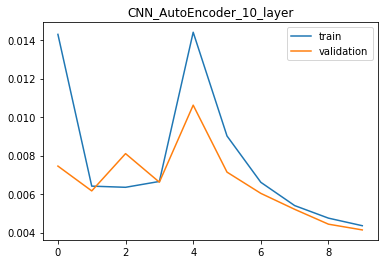

Original


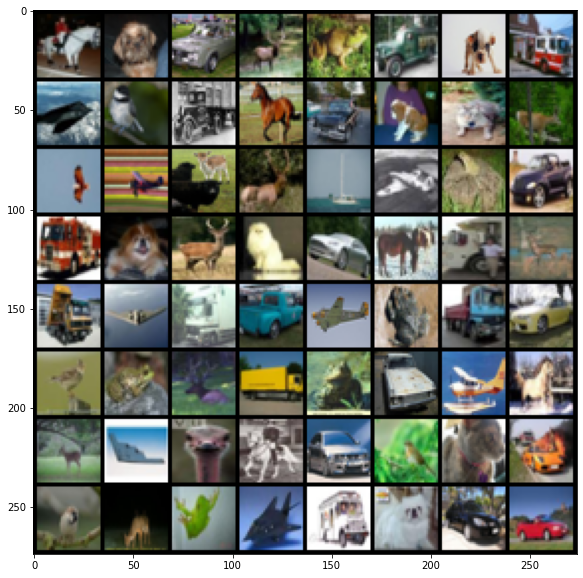

Predictions


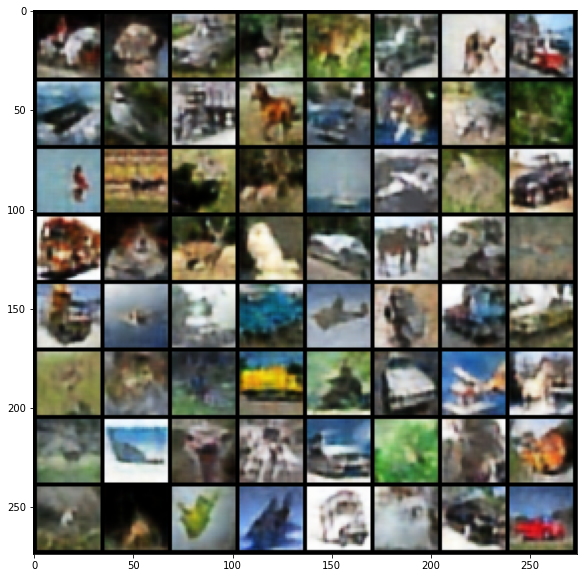

In [ ]:
model_CNN_10_=ConvAutoencoder_10_layer().to(device)
optimiser=optim.Adam(model_CNN_10_.parameters(),lr=1e-3)
criterion=nn.MSELoss().to(device)

model_CNN_10_,_,_=train_optim(trainloader,testloader,model_CNN_10_,optimiser,criterion,"CNN_AutoEncoder_10_layer",10)


We see that as the number of layers increases, the reconstructed images get better up to a point (layers = 5), and then they start to get worse (layers = 10). This is so that the autoencoder may learn more intricate and detailed representations of the input data as we increase the number of layers. Overfitting could result from a layer count increase that is too great.

### Explaination time!
Please write a short-essay explaining what AutoEncoder does, how it is different from other data-representation methods like PCA, t-SNE and Variational AutoEncoders. Also tell what were your take-outs from this experiment.

A particular class of neural network called an autoencoder automatically learns a compressed version of the input data. It consists mostly of an encoder and a decoder that are trained together to accurately reconstruct the input data.

The decoder converts this compressed form back to the original input shape after the encoder has converted the input data to a lower dimensional representation. The autoencoder gains the ability to recognise the most crucial elements and patterns of the input data by reducing the difference between the original and recreated data.

There are various ways in which autoencoders differ from other data-representation techniques like PCA, t-SNE, and Variational AutoEncoders (VAEs).


Dimensionality reduction techniques such as PCA and Autoencoder both use linear statistical methodologies.

PCA finds the directions of maximum variance in the data and projects the data onto a lower-dimensional subspace, while Autoencoder learns an efficient data representation by reconstructing the input data.

While VAEs are generative models that can generate new data and provide a measure of uncertainty, while autoencoders are mostly used for data compression and reconstruction, both autoencoders and VAEs are used for unsupervised learning and can learn meaningful representations of data.


The method used for encoding and decoding is another distinction between autoencoders and VAEs. The encoding and decoding operations of autoencoders are typically implemented as deterministic neural networks. VAEs use probabilistic encoding and decoding functions, with the encoding function mapping input to the mean and standard deviation of a Gaussian distribution and the decoding function sampling from that distribution to produce an output.

Autoencoders are useful for feature extraction, compression, and anomaly detection, while t-SNE is primarily used for data visualization. Additionally, t-SNE requires all the data to be loaded into memory, making it computationally expensive for large datasets, whereas autoencoders can handle large datasets using mini-batch training.

In [ ]:
# explainations here

## Part 2: The return of kNN
Autoencoder representations can be useful for a wide range of machine learning tasks beyond just reconstructing input data. For example, the output of an encoder can be used as a feature representation for classification using k-Nearest Neighbors (kNN) or other classifiers. Similarly, the encoded representations can be used for unsupervised tasks like clustering, where the model groups similar images together based on their feature representation. This makes autoencoders a versatile tool for feature learning, with the potential to enhance the performance of a wide range of machine learning algorithms.

Since we have already trained auto-encoder on CIFAR-10, we will employ the encoder from the CNN model with representation size of $10$. Using a subset of CIFAR-10 train and test datasets, each with 10,000 and 1000 samples respectively, with an equal number of samples for each class, implement kNN classification using the encoder output as features. Share your findings and accuracy, F1 score and other relavant metrics on the test set. What insights can you draw from the results?

You are allowed to use sklearn or any other library for kNN and splitting dataset.

In [15]:
from torch.utils.data import TensorDataset, DataLoader

num_samples_per_class = 1000

# Define the number of classes
num_classes = 10

# Load the CIFAR-10 dataset
train_dataset = datasets.CIFAR10(root='data/', train=True, download=True)
test_dataset = datasets.CIFAR10(root='data/', train=False, download=True)
print(train_dataset[0])
# Initialize the new train and test datasets
new_train_dataset = []
new_test_dataset = []
new_train_dataset_target=[]
new_test_dataset_target=[]
def transform(dataset):
  l=[]
  for i in dataset:
    # img=i[0]
    # print(i.shape)
    # print(type(i))
    try:
      img=i
      img=np.array(img)
      l.append(np.transpose(img,(2,1,0)))
    except:
      print(type(i))
  return l
# Loop over the classes
for i in range(num_classes):
    train_indices = np.where(np.array(train_dataset.targets) == i)[0][:1000]
    test_indices = np.where(np.array(test_dataset.targets) == i)[0][:100]

    new_train_dataset.extend([train_dataset.data[index ]for index in train_indices])
    new_train_dataset_target.extend([train_dataset.targets[index]for index in train_indices])
    new_test_dataset.extend([test_dataset.data[index] for index in test_indices])
    new_test_dataset_target.extend([test_dataset.targets[index] for index in test_indices])
# print(new_train_dataset[-1].shape)

new_train_dataset=transform(new_train_dataset)
print((new_train_dataset[0].shape))
train_dataset_ = TensorDataset(torch.Tensor((new_train_dataset)),torch.Tensor((new_train_dataset_target))) # create your datset
new_train_loader = DataLoader(train_dataset_,batch_size=BATCH_SIZE,num_workers=2) # create your dataloader

new_test_dataset=transform(new_test_dataset)
print((new_test_dataset[0].shape))
test_dataset_ = TensorDataset(torch.Tensor((new_test_dataset)),torch.Tensor((new_test_dataset_target))) # create your datset
new_test_loader = DataLoader(test_dataset_,batch_size=BATCH_SIZE,num_workers=2) # create your dataloader

# new_train_loader = torch.utils.data.DataLoader(new_train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
# new_test_loader = torch.utils.data.DataLoader(new_test_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)

# new_train_dataset = torch.utils.data.TensorDataset(torch.stack([torch.from_numpy(np.transpose(item[0], (2, 0, 1))) for item in new_train_dataset]).to(device), torch.LongTensor([item[1] for item in new_train_dataset]).to(device))
# new_test_dataset = torch.utils.data.TensorDataset(torch.stack([torch.from_numpy(np.transpose(item[0], (2, 0, 1))) for item in new_test_dataset]).to(device), torch.LongTensor([item[1] for item in new_test_dataset]).to(device))

# # Create data loaders for the new train and test datasets
# new_train_loader = torch.utils.data.DataLoader(new_train_dataset, batch_size=64, shuffle=True)
# new_test_loader = torch.utils.data.DataLoader(new_test_dataset, batch_size=64, shuffle=False)


Files already downloaded and verified
Files already downloaded and verified
(<PIL.Image.Image image mode=RGB size=32x32 at 0x7F99688487F0>, 6)
(3, 32, 32)


<ipython-input-15-14ef64b219b4>:43: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:230.)
  train_dataset_ = TensorDataset(torch.Tensor((new_train_dataset)),torch.Tensor((new_train_dataset_target))) # create your datset


(3, 32, 32)


In [ ]:
# print(len(new_train_dataset[0][0][0][0]))

Epoch: 1, Train Loss: 0.0270, Test Loss: 0.0192
Epoch: 2, Train Loss: 0.0180, Test Loss: 0.0171
Epoch: 3, Train Loss: 0.0164, Test Loss: 0.0160
Epoch: 4, Train Loss: 0.0153, Test Loss: 0.0145
Epoch: 5, Train Loss: 0.0141, Test Loss: 0.0137
Epoch: 6, Train Loss: 0.0135, Test Loss: 0.0134
Epoch: 7, Train Loss: 0.0133, Test Loss: 0.0131
Epoch: 8, Train Loss: 0.0131, Test Loss: 0.0131
Epoch: 9, Train Loss: 0.0131, Test Loss: 0.0131
Epoch: 10, Train Loss: 0.0131, Test Loss: 0.0130


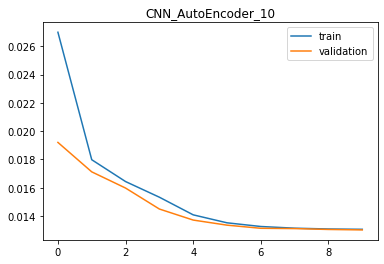

Original


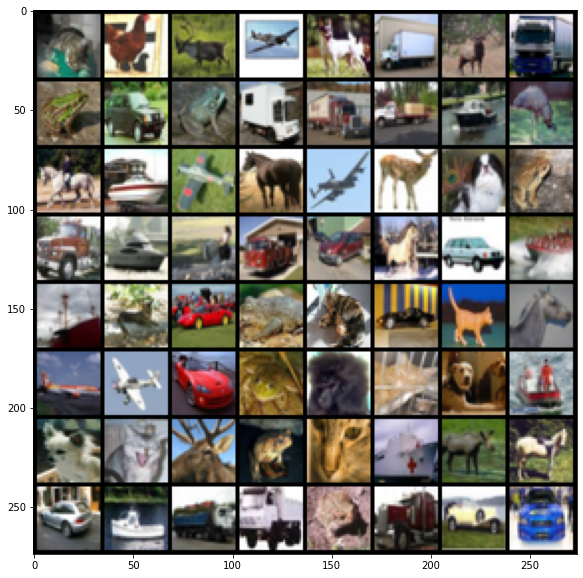

Predictions


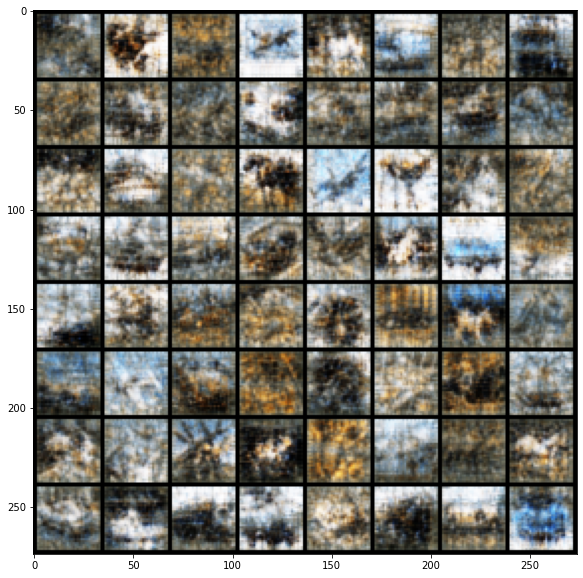

In [13]:
model_CNN_10=ConvAutoencoder_10().to(device)
optimiser=optim.Adam(model_CNN_10.parameters(),lr=1e-3)
criterion=nn.MSELoss().to(device)

model_CNN_10,_,_=train_optim(trainloader,testloader,model_CNN_10,optimiser,criterion,"CNN_AutoEncoder_10",10)


In [17]:
from sklearn.neighbors import KNeighborsClassifier

def define_knn(X_train,y_train,x_test,y_test):
  knn=KNeighborsClassifier()
  knn.fit(X_train,y_train)
  pred=knn.predict(x_test)
  print(accuracy_score(pred,y_test))
def knn_perform_util(model,dataloader):
    model.eval()
    encode_list=[]
    with torch.no_grad():
            
      out_loss = 0
      for batch_idx, (data, target) in enumerate(dataloader):

        data=data.to(device)
        target = target.to(device)
        # print(data.shape)
        encode,decode=model(data)
        encode=encode.cpu().detach().numpy().tolist()
        encode_list=encode_list+encode
    model.train()
    return encode_list

def knn_perform(model,k=5):

    encode_train_list=knn_perform_util(model,new_train_loader)
    # encode_test_list=knn_perform_util(model,new_test_loader)
    # print(len(en))
    test_encode_list=knn_perform_util(model_CNN_10,new_test_loader)
    knn=define_knn(encode_train_list,new_train_dataset_target,test_encode_list,new_test_dataset_target)
    # print(len(encode_test_list))
    # return knn



knn=knn_perform(model_CNN_10)
# def classification(knn,x_test,y_train):
#   _,indices=knn.kneighbors(x_test)
#   ans=[]
#   for i in indices:
#     arr=np.zeros(10)
#     for index in i:
#       arr[y_train[index]]+=1
#     ans.append(np.argmax(arr))
#   return ans

# list_of_ans=classification(knn,test_encode_list,new_train_dataset_target)

0.233


Test accuracy:0.233
Train accuracy: 0.46

We can observe that the accuracy is poor. This might be as a result of a too-small representation size. The autoencoder cannot learn a decent representation of the input data as a result. This is further supported by the poor quality of the rebuilt images. It might be enhanced by increasing the representation size.

## Part 3: Siamese Network (not part of assignment)
Siamese networks are useful for comparing and finding similarities between two inputs. The inputs from identical encoder sub-networks will be given as an input to a dense network (an MLP) and the prediction will be given as output of a Sigmoid function.

Employ the encoder from the best model to be used as the two-identical sub-networks of the Siamese Network. So, copy the weights from the best encoder to the two-identical sub-networks, set the learning rate of this encoder to be lower by a couple of order than that of the dense network.

Who knows, this might be part of next assignment during hectic times. (wink wink)
(Don't quote me on this though)

### Step one: Define a Siamese Network

In [ ]:
# sample.
class SiameseNetwork(nn.Module):
    def __init__(self, encoder):
        super().__init__()
        self.encoder1 = encoder
        self.encoder2 = encoder
        self.decoder = nn.Sequential(
            nn.Linear(2048,1024),
            # whatever
        )

    def forward(self, x1, x2):
        encoded1 = self.encoder1(x1)
        encoded2 = self.encoder2(x2)
        return (encoded1,encoded2)
        
    def differentiate(self, x1_embedding, x2_embedding):
        x = torch.cat([x1_embedding,x2_embedding],dim=1)
        return self.decoder(x)


### Step two: Define the following three losses:
1. TripletLoss
2. ContrastiveLoss
3. Regularized Cross Entropy Loss

In [ ]:
# TripletLoss defined as an example
class TripletLoss(nn.Module):
    def __init__(self, margin):
        super(TripletLoss, self).__init__()
        self.margin = margin

    def forward(self, anchor, positive, negative):
        # Compute the distances between the anchor, positive, and negative examples
        distance_pos = F.pairwise_distance(anchor, positive, p=2)
        distance_neg = F.pairwise_distance(anchor, negative, p=2)
        # Compute the triplet loss using the margin
        loss_triplet = torch.mean(torch.clamp(distance_pos - distance_neg + self.margin, min=0.0))
        return loss_triplet

In [ ]:
# code here

### Train the Siamese network...
... and write a function that takes 2 inputs and outputs whether they belong to the same class or not. Plot and share the results of the function. The results should contain both successful results, i.e. classification as 'same' for inputs belonging to the same class and classification as 'not-same' for inputs belonging to different classes, as well as some unsuccessful results (that gives the wrong output than expected).
Provide an explanation of why the unsuccessful results might occur.

In [ ]:
# code and analysis here

### And again. What did we learn?
Discuss any and all learnings here. The discussions must be all-encompassing so that we know what did you learn. 

To re-iterate: "Please do not copy from your friend or copy-paste from the internet. We can see repetitions during evaluations."